## Sim Demo

### Imports

In [10]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
from env.imports import *

In [12]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run) 

absolute_root_path /scratch/asr655/neuroinformatics/GeneEx2Conn


<module 'sim.sim_run' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/sim/sim_run.py'>

#### Check job specs

In [13]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 17.0%
RAM Usage: 10.8%
Available RAM: 898.6G
Total RAM: 1007.0G
52.4G


In [14]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.00 GB


In [15]:
print("XGBoost version:", xgboost.__version__)
print("cupy version:", cp.__version__)

GPUtil.getAvailable()

# if a number is seen a GPU is available
GPUtil.getGPUs()

DEVICE_ID_LIST = GPUtil.getFirstAvailable()
DEVICE_ID = DEVICE_ID_LIST[0] # grab first element from list
if DEVICE_ID != None: 
    print('GPU found', DEVICE_ID)
    use_gpu = True

    GPUtil.showUtilization()

XGBoost version: 2.0.3
cupy version: 13.1.0
GPU found 0
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |


In [16]:
torch.cuda.is_available()

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()

#### Simulation tests <a id="sims"></a>

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
feature_name:  transcriptome
processing_type:  None
features ['transcriptome']
X generated... expanding to pairwise dataset
2
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'decoder': 'mlp', 'n_components': 10, 'max_iter': 1000, 'scale': True, 'optimize_encoder': False, 'hidden_dims': [128, 64], 'learning_rate': 9e-05, 'batch_size': 512, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}
X_train shape: torch.Size([341, 7380])
Y_train shape: torch.Size([341, 341])
x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])


  warnings.warn(



Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.00 GB
Best val loss so far at epoch 1: 0.0479
Best val loss so far at epoch 2: 0.0364
Best val loss so far at epoch 3: 0.0291
Best val loss so far at epoch 4: 0.0275
Best val loss so far at epoch 5: 0.0258
Epoch 5/100, Train Loss: 0.0503, Val Loss: 0.0258, Time: 4.19s
Best val loss so far at epoch 6: 0.0252
Best val loss so far at epoch 7: 0.0249
Best val loss so far at epoch 8: 0.0242
Best val loss so far at epoch 9: 0.0238
Best val loss so far at epoch 10: 0.0232
Epoch 10/100, Train Loss: 0.0282, Val Loss: 0.0232, Time: 4.20s
Best val loss so far at epoch 11: 0.0230
Best val loss so far at epoch 12: 0.0227
Best val loss so far at epoch 13: 0.0226
Best val loss so far at epoch 14: 0.0222
Epoch 15/100, Train Loss: 0.0236, Val Loss: 0.0222, Time: 4.32s
Best val loss so far at epoch 16: 0.0221
Best val loss so far at epoch 17: 0.0218
Best val loss so far at epoch 18: 0.0215
Best val loss so far at epoch 19: 0.0213
Best 

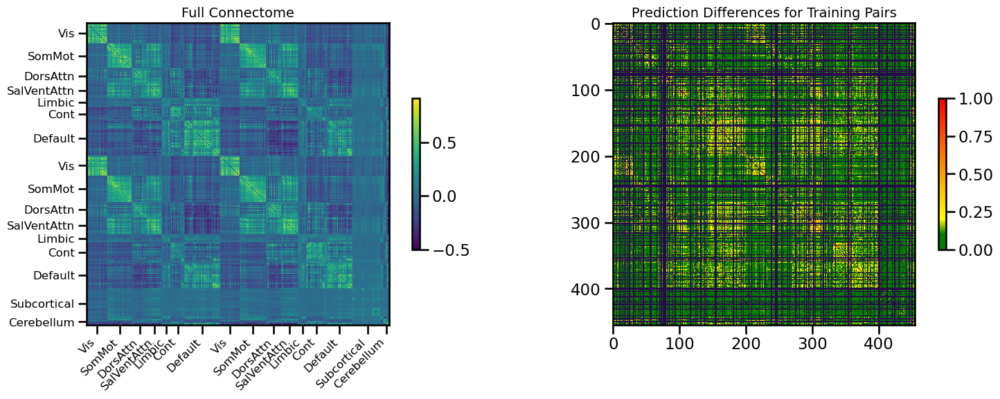

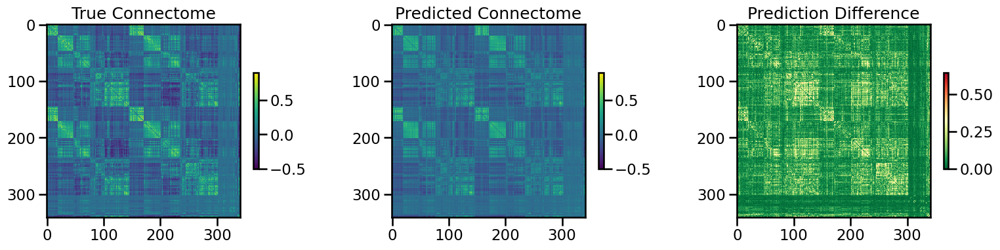

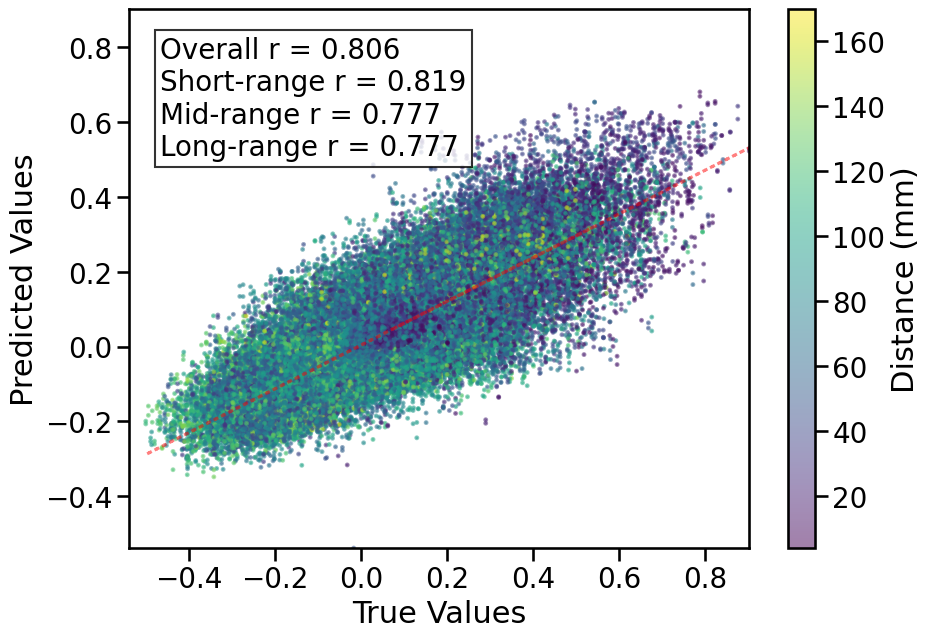

Y_pred shape: (12882,)
Y_true shape: (12882,)


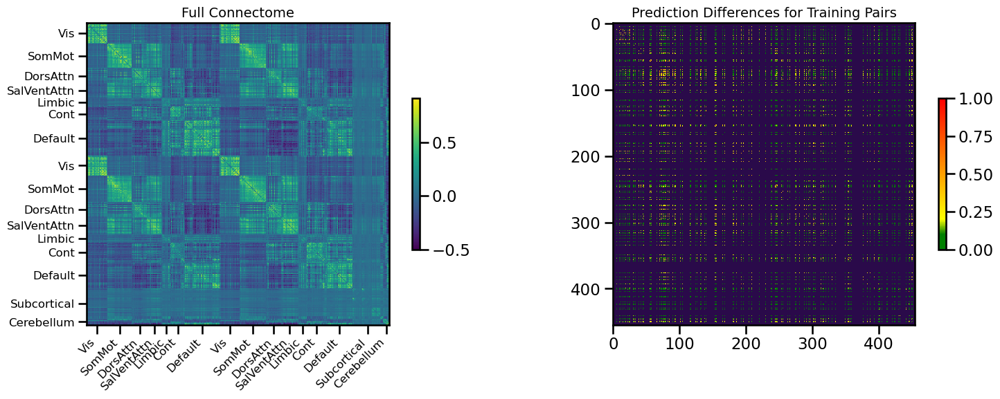

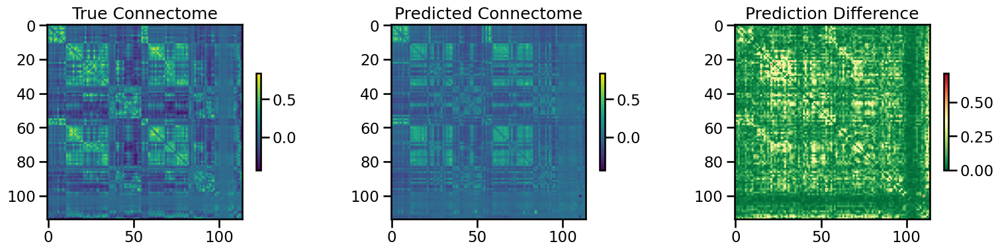

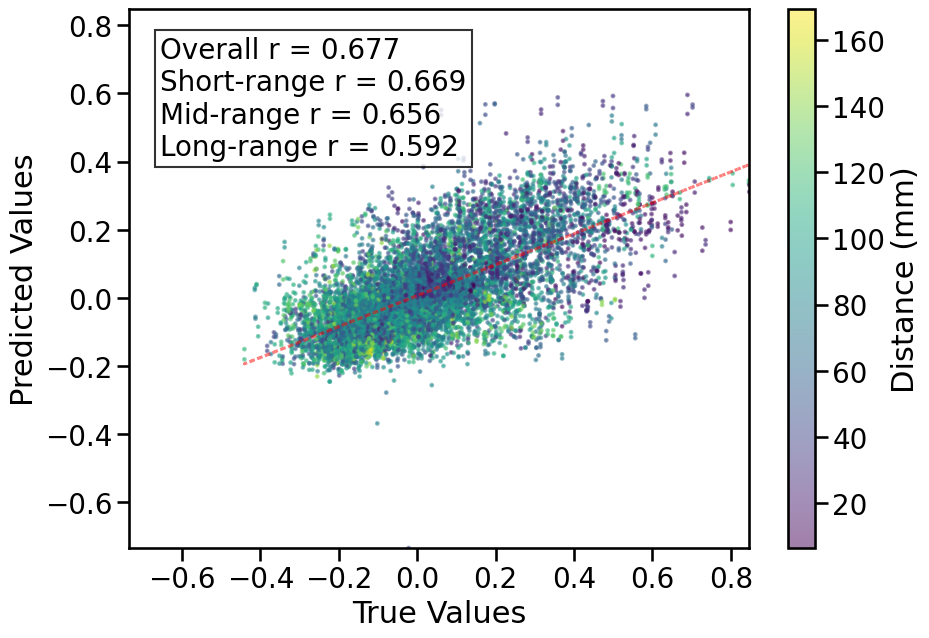


TRAIN METRICS: {'mse': 0.012102996, 'mae': 0.078806646, 'r2': 0.6427266470200337, 'pearson_r': 0.8059383583999963, 'short_r': 0.8193005123165893, 'mid_r': 0.7770935854965499, 'long_r': 0.7772681773177033, 'geodesic_distance': 24.019818678574428}
TEST METRICS: {'mse': 0.017767332, 'mae': 0.09536094, 'r2': 0.457307033272622, 'pearson_r': 0.6773370793717868, 'short_r': 0.6688872768679482, 'mid_r': 0.6562623185828693, 'long_r': 0.5922477044978613, 'geodesic_distance': 14.112126352217999}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'binarize': False, 'batch_size': 512, 'epochs': 100}
1
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'decoder': 'mlp', 'n_components': 10, 'max_iter': 1000, 'scale': True, 'optimize_encoder': False, 'hidden_dims': [128, 64], 'learning_rate': 9e-05, 'batch_size': 2048, 'dropout_rate': 0.2, 'weight_decay': 0.0001, 'epochs': 100}
X_train shape: torch.Size([341, 7380])
Y_train shape: torch.Size([341, 341])


  warnings.warn(



x_projector shape: torch.Size([7380, 10])
x_loadings shape: torch.Size([7380, 10])
Available GPUs: 1
GPU 0: NVIDIA A100-SXM4-80GB - Memory Allocated: 0.02 GB
Best val loss so far at epoch 1: 0.0587
Best val loss so far at epoch 3: 0.0519
Best val loss so far at epoch 4: 0.0455
Best val loss so far at epoch 5: 0.0404
Epoch 5/100, Train Loss: 0.0968, Val Loss: 0.0404, Time: 6.79s
Best val loss so far at epoch 6: 0.0381
Best val loss so far at epoch 7: 0.0373
Best val loss so far at epoch 8: 0.0352
Best val loss so far at epoch 9: 0.0345
Epoch 10/100, Train Loss: 0.0651, Val Loss: 0.0353, Time: 6.55s
Best val loss so far at epoch 11: 0.0333
Best val loss so far at epoch 12: 0.0330
Best val loss so far at epoch 13: 0.0309
Best val loss so far at epoch 14: 0.0301
Best val loss so far at epoch 15: 0.0296
Epoch 15/100, Train Loss: 0.0484, Val Loss: 0.0296, Time: 6.58s
Best val loss so far at epoch 17: 0.0296
Best val loss so far at epoch 18: 0.0288
Best val loss so far at epoch 20: 0.0283
Epo

In [ ]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              null_model='none',
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='expression',
              gene_list='0.2',
              cv_type='random',
              random_seed=42,
              search_method=('wandb', 'mse', 1),
              track_wandb=False,
              skip_cv=True,
              model_type='pls_twostep',
              use_gpu=True
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()

Number of components for 95% variance PCA: 27
Number of 1s: 36662, Number of 0s: 171274, Class balance (1s): 0.176
Number of 1s: 17738, Number of 0s: 190198, Class balance (1s): 0.085
X shape: (455, 7380)
X_pca shape: (455, 27)
Y_sc shape: (455, 455)
Y_sc_spectralL shape: (455, 455)
Y_sc_spectralA shape: (455, 456)
Y_fc shape: (455, 455)
Coordinates shape: (455, 3)
Y shape (455, 455)
feature_name:  transcriptome
processing_type:  None
features ['transcriptome']
X generated... expanding to pairwise dataset


  warnings.warn(



2
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'use_positional_encoding': False, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.07 GB
Best val loss so far at epoch 1: 0.0327
Best val loss so far at epoch 2: 0.0275
Best val loss so far at epoch 3: 0.0249
Best val loss so far at epoch 4: 0.0234
Best val loss so far at epoch 5: 0.0220
Epoch 5/50, Train Loss: 0.0373, Val Loss: 0.0220, Time: 13.80s
Best val loss so far at epoch 6: 0.0208
Best val loss so far at epoch 7: 0.0205
Epoch 10/50, Train Loss: 0.0166, Val Loss: 0.0224, Time: 13.66s
Best val loss so far at epoch 13: 0.0200
Epoch 15/50, Train Loss: 0.0099, Val Loss: 0.0204, Time: 13.54s
Best val loss so far at epoch 18: 0.0198
Best 

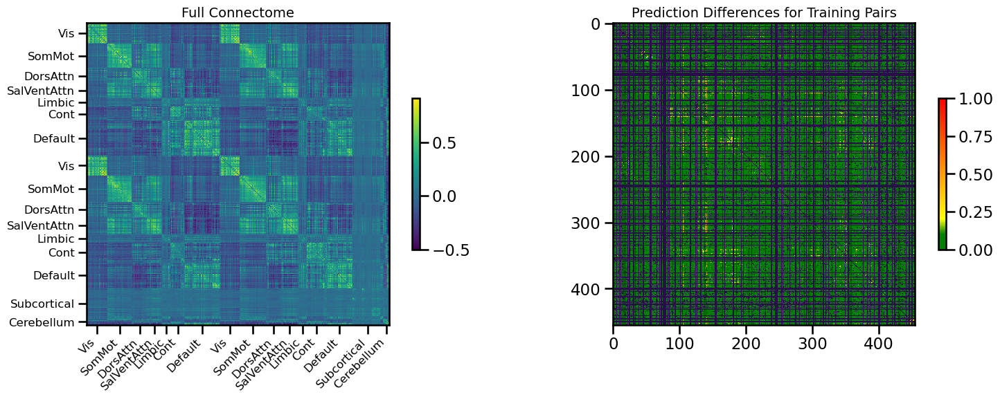

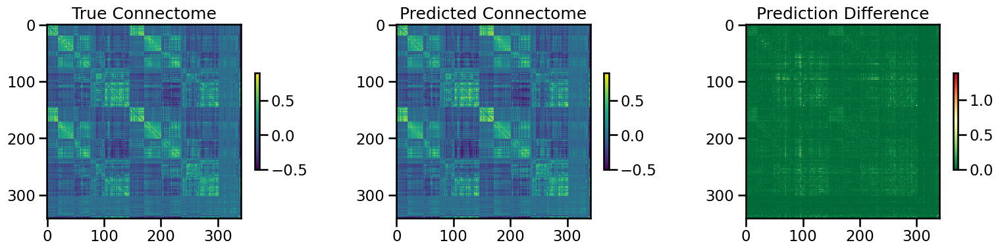

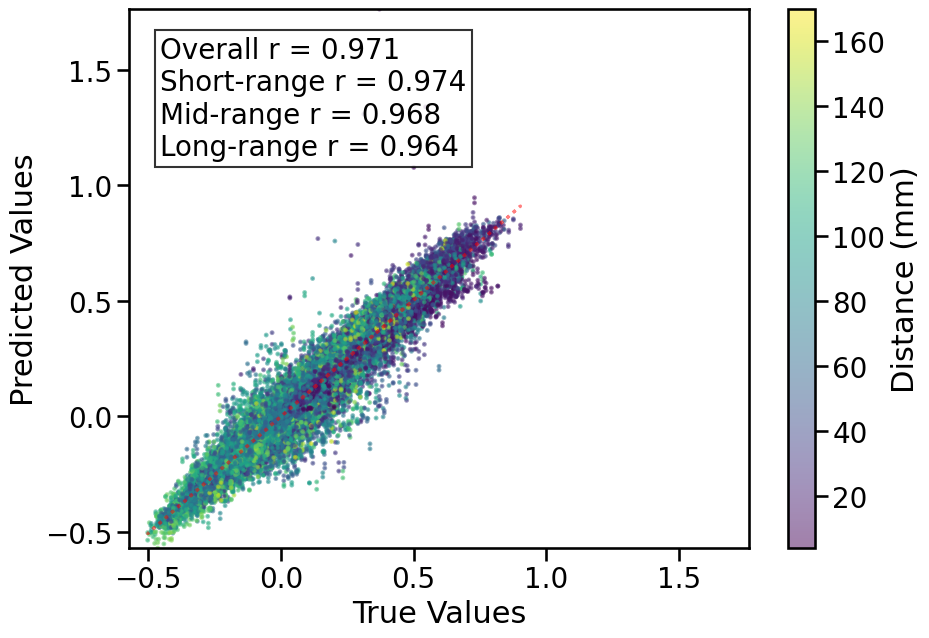

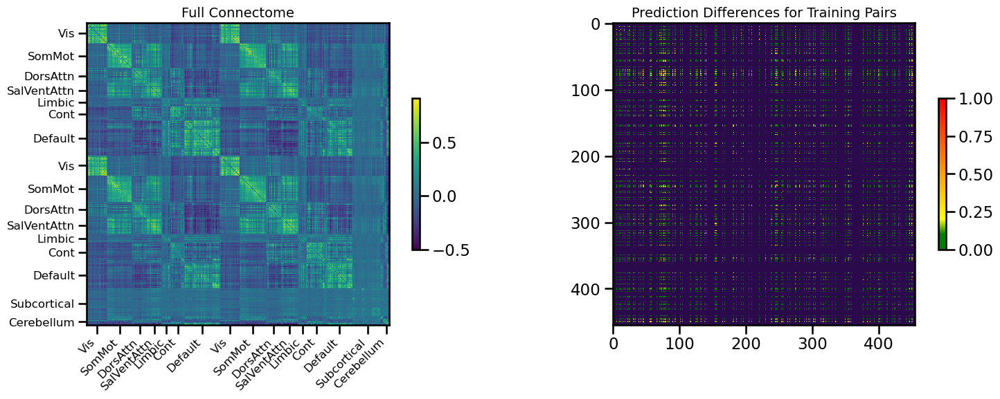

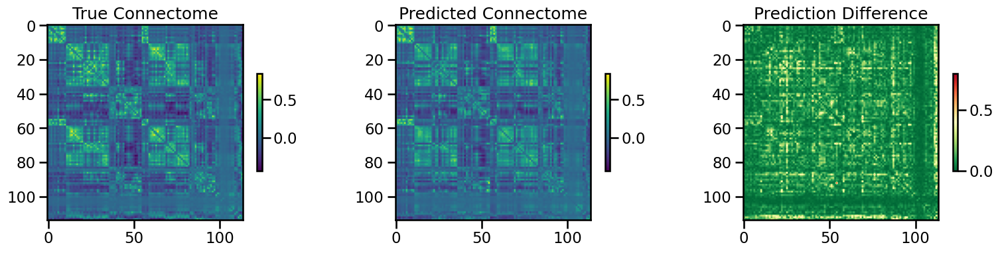

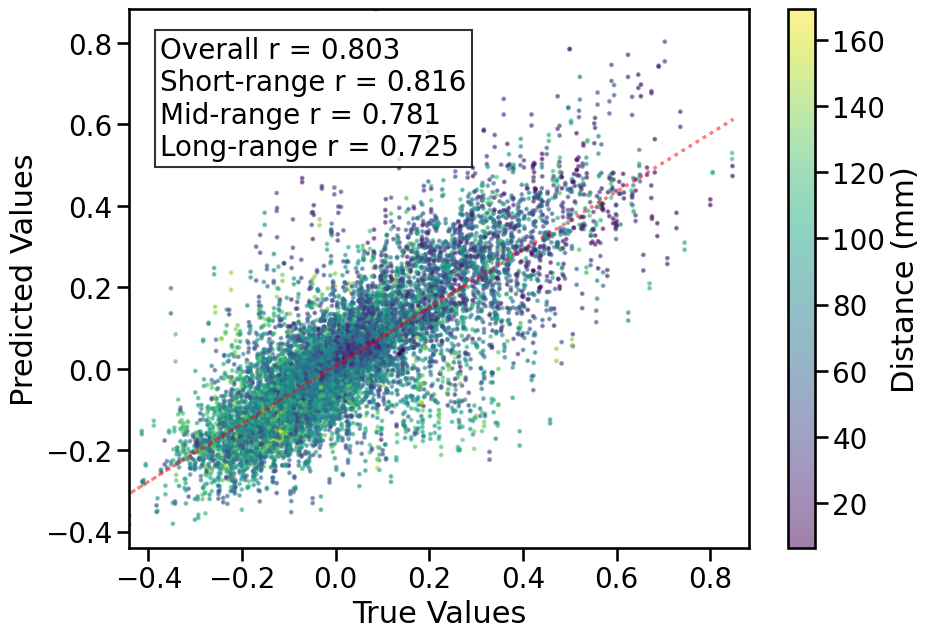


TRAIN METRICS: {'mse': 0.002067895, 'mae': 0.030397734, 'r2': 0.9389569554338669, 'pearson_corr': 0.9714636697225634, 'geodesic_distance': 13.433273245287651}
TEST METRICS: {'mse': 0.011860598, 'mae': 0.0748023, 'r2': 0.6377248585331228, 'pearson_corr': 0.8030604864951262, 'geodesic_distance': 9.134924485565177}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 7380, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'use_positional_encoding': False, 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}


  warnings.warn(



1
3
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'use_positional_encoding': False, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.10 GB
Best val loss so far at epoch 1: 0.0384
Best val loss so far at epoch 2: 0.0368
Best val loss so far at epoch 3: 0.0316
Best val loss so far at epoch 4: 0.0294
Best val loss so far at epoch 5: 0.0282
Epoch 5/50, Train Loss: 0.0421, Val Loss: 0.0282, Time: 13.80s
Best val loss so far at epoch 6: 0.0275
Best val loss so far at epoch 7: 0.0261
Best val loss so far at epoch 8: 0.0240
Best val loss so far at epoch 10: 0.0232
Epoch 10/50, Train Loss: 0.0198, Val Loss: 0.0232, Time: 13.92s
Best val loss so far at epoch 11: 0.0217
Best val loss so far at epoch

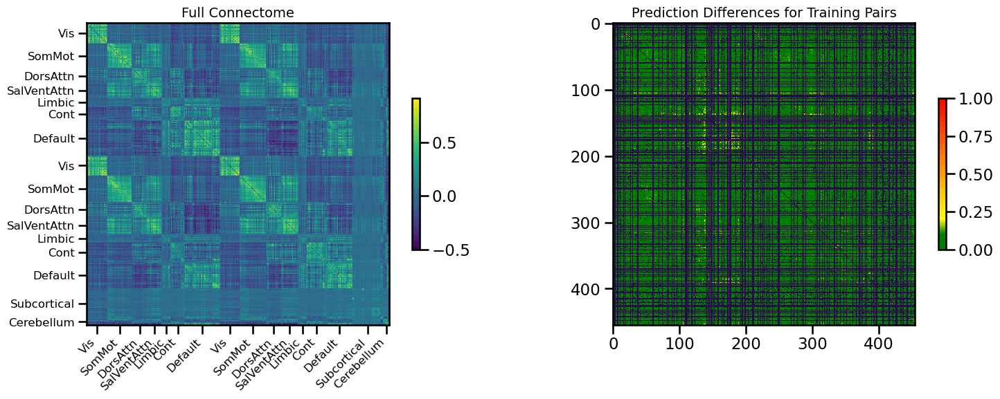

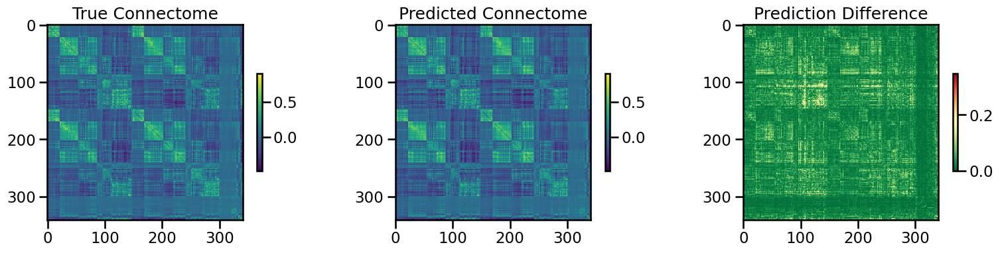

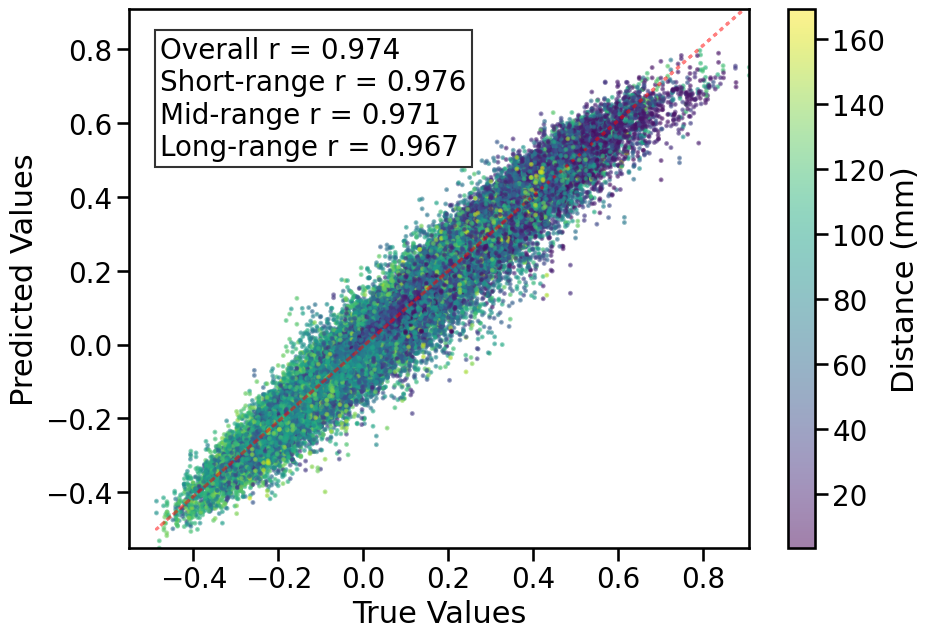

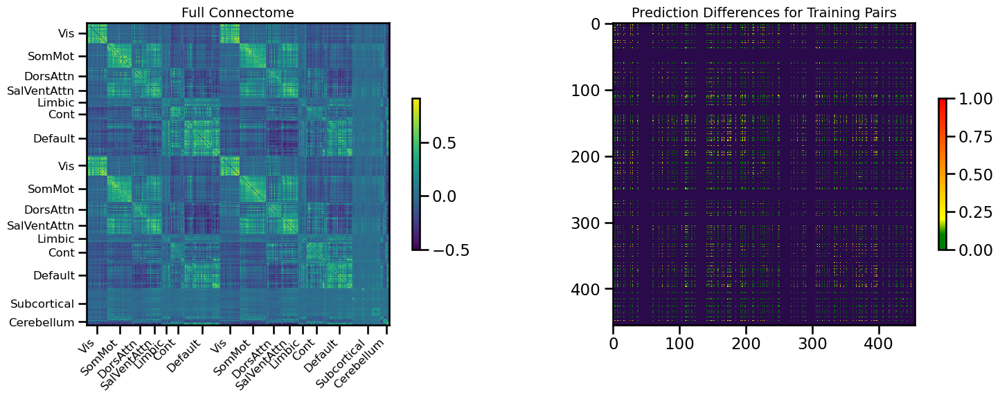

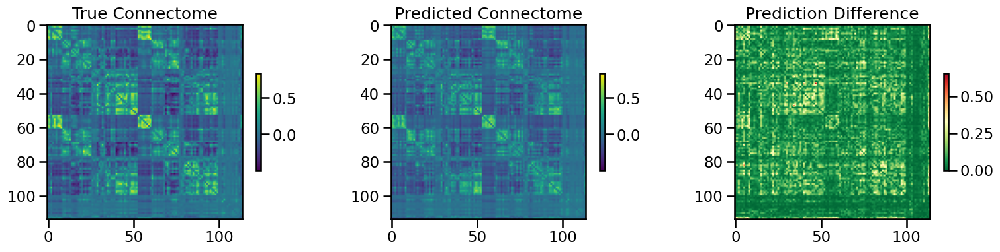

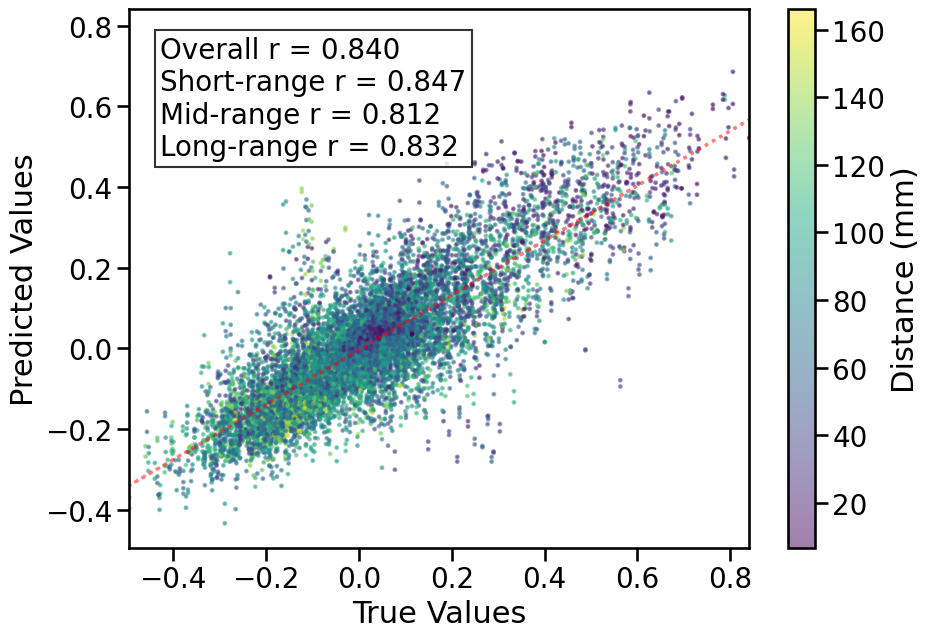


TRAIN METRICS: {'mse': 0.0018953673, 'mae': 0.031311303, 'r2': 0.9430537067970586, 'pearson_corr': 0.973914775173023, 'geodesic_distance': 14.354977700744445}
TEST METRICS: {'mse': 0.010428399, 'mae': 0.071521975, 'r2': 0.702426008554603, 'pearson_corr': 0.8399835807303296, 'geodesic_distance': 10.231978414060762}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 7380, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'use_positional_encoding': False, 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}


  warnings.warn(



1
2
4
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'use_positional_encoding': False, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.10 GB
Best val loss so far at epoch 1: 0.0331
Best val loss so far at epoch 2: 0.0307
Best val loss so far at epoch 3: 0.0295
Best val loss so far at epoch 4: 0.0280
Epoch 5/50, Train Loss: 0.0468, Val Loss: 0.0283, Time: 13.75s
Best val loss so far at epoch 6: 0.0277
Best val loss so far at epoch 7: 0.0255
Best val loss so far at epoch 8: 0.0250
Best val loss so far at epoch 9: 0.0231
Best val loss so far at epoch 10: 0.0227
Epoch 10/50, Train Loss: 0.0227, Val Loss: 0.0227, Time: 13.15s
Best val loss so far at epoch 11: 0.0226
Epoch 15/50, Train Loss: 0.01

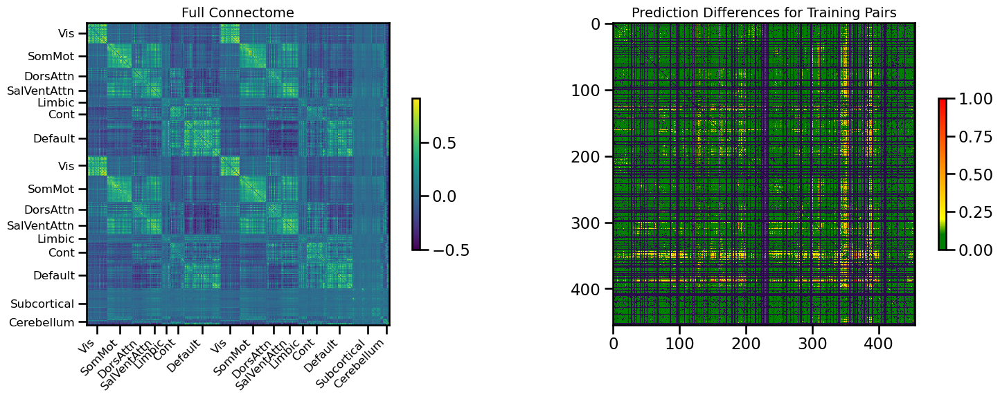

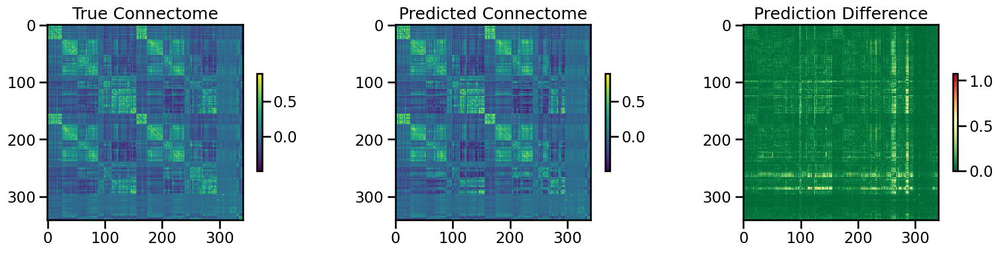

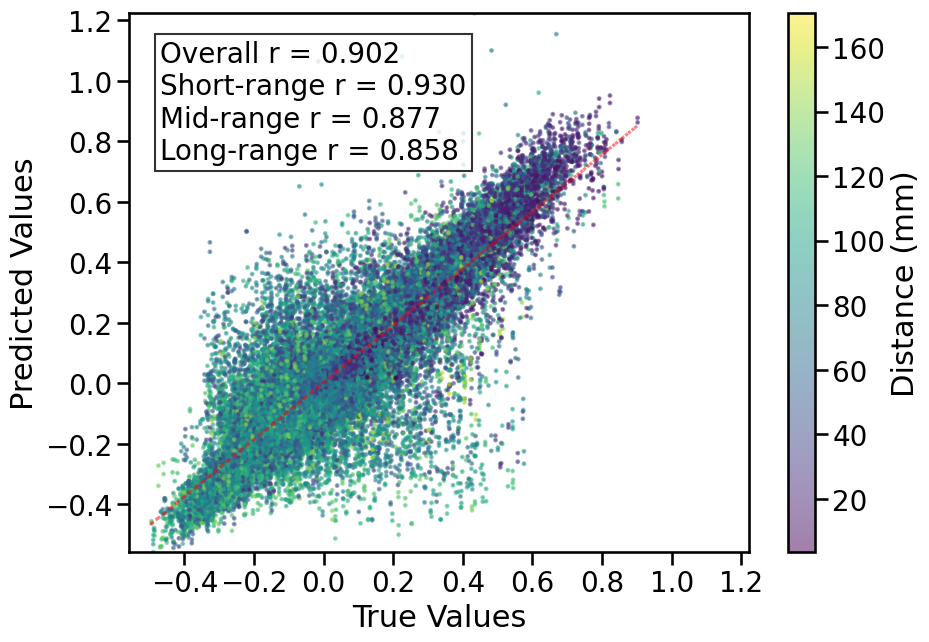

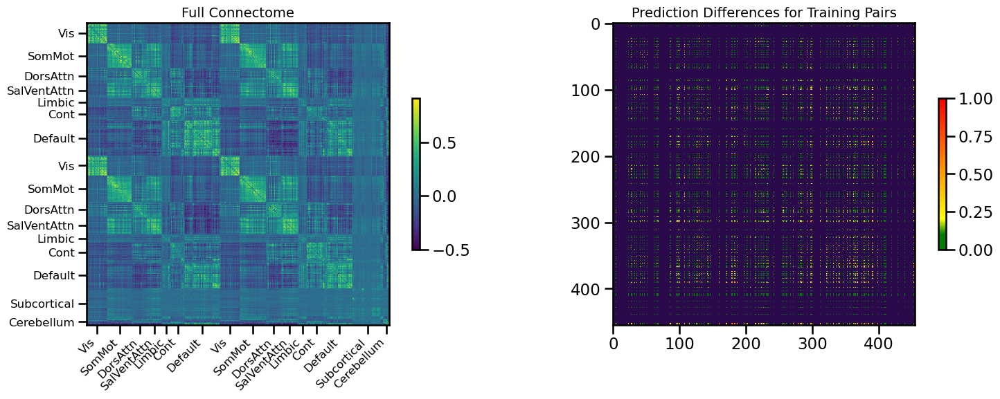

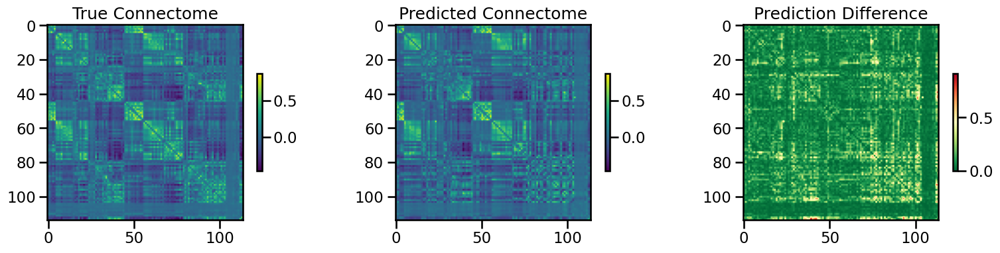

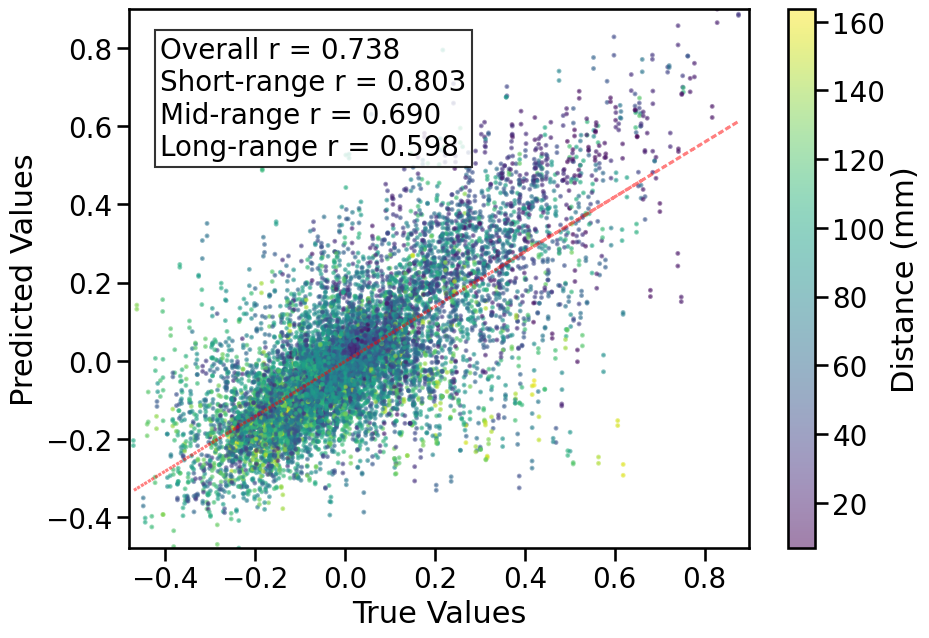


TRAIN METRICS: {'mse': 0.006829808, 'mae': 0.048224688, 'r2': 0.7937951453103652, 'pearson_corr': 0.9021491291918582, 'geodesic_distance': 15.919375803385252}
TEST METRICS: {'mse': 0.017059965, 'mae': 0.088653125, 'r2': 0.49758379196143177, 'pearson_corr': 0.7379201478077867, 'geodesic_distance': 9.976872607527845}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 7380, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'use_positional_encoding': False, 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}


  warnings.warn(



1
2
3
BEST CONFIG {'input_dim': 14760, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'use_positional_encoding': False, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.10 GB
Best val loss so far at epoch 1: 0.0359
Best val loss so far at epoch 2: 0.0321
Best val loss so far at epoch 3: 0.0293
Best val loss so far at epoch 4: 0.0279
Best val loss so far at epoch 5: 0.0244
Epoch 5/50, Train Loss: 0.0379, Val Loss: 0.0244, Time: 13.78s
Best val loss so far at epoch 6: 0.0229
Best val loss so far at epoch 7: 0.0225
Best val loss so far at epoch 8: 0.0222
Best val loss so far at epoch 9: 0.0215
Epoch 10/50, Train Loss: 0.0201, Val Loss: 0.0222, Time: 13.69s
Best val loss so far at epoch 15: 0.0178
Epoch 15/50, Train Loss: 0.011

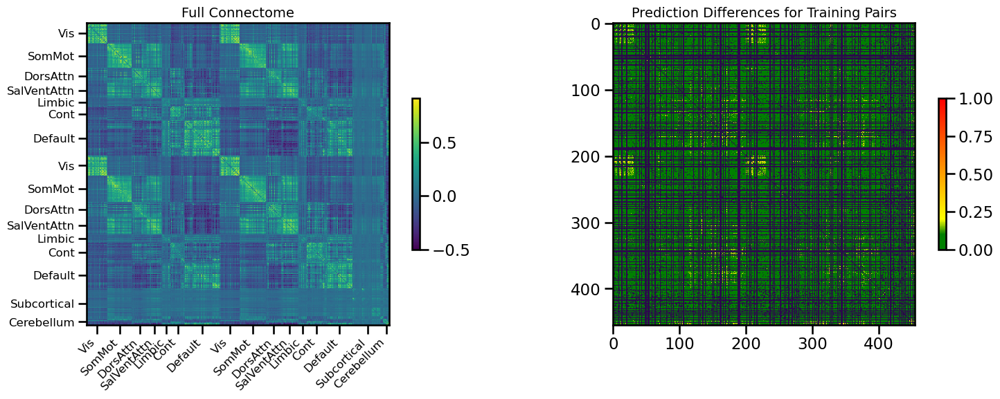

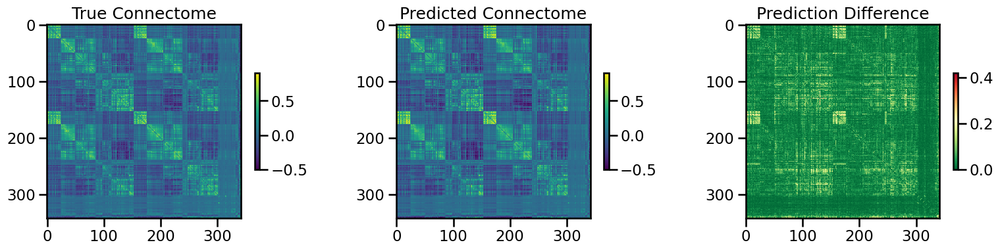

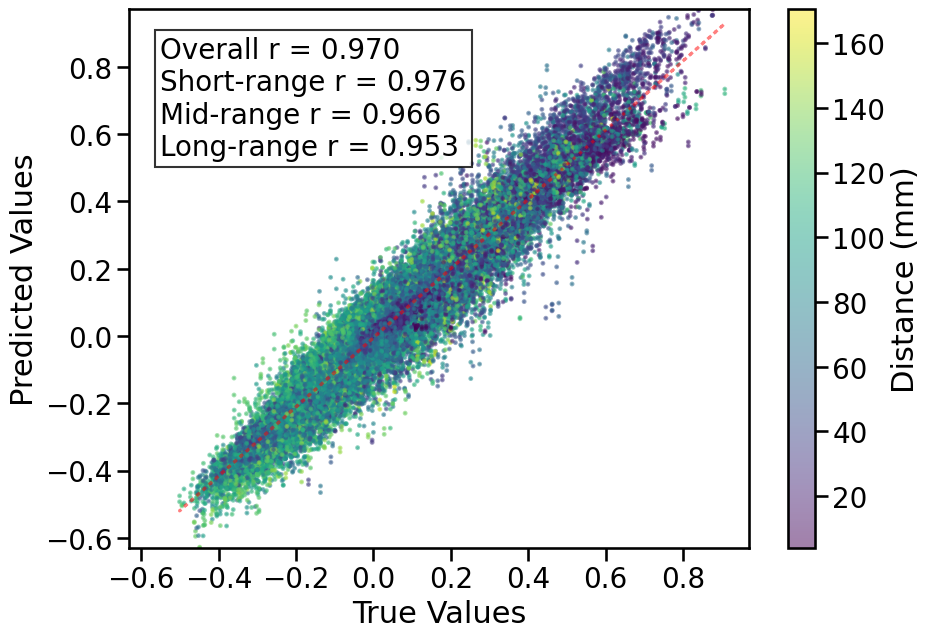

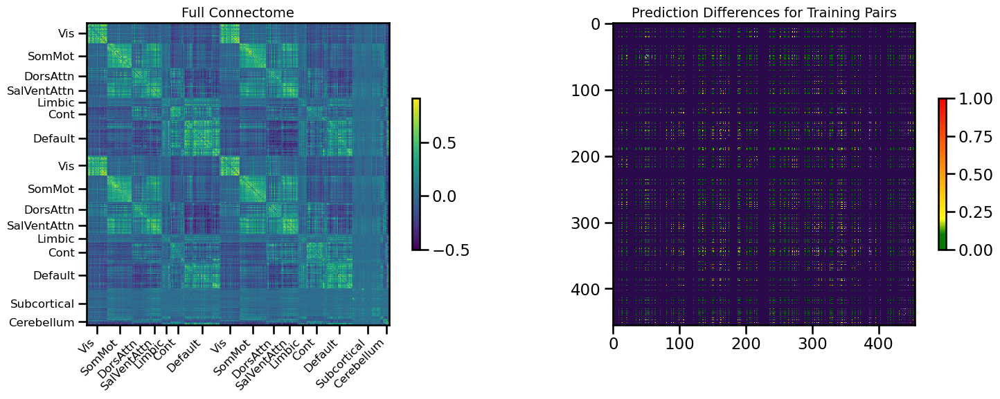

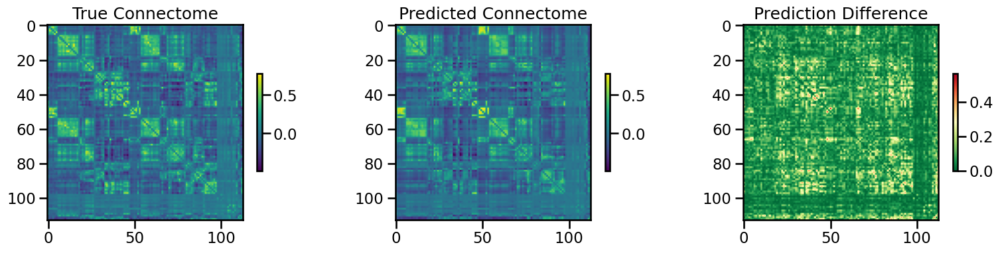

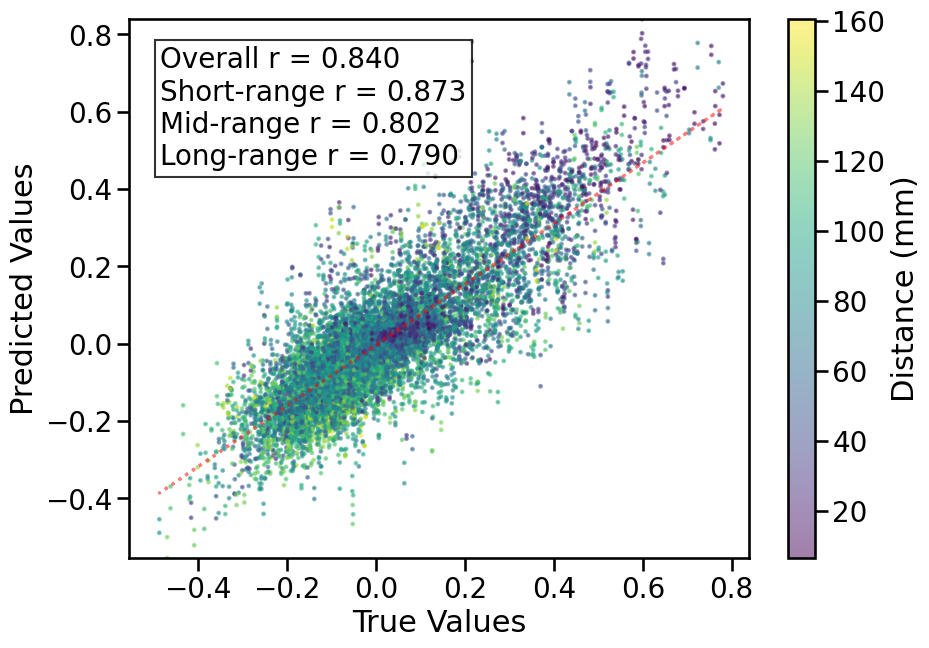


TRAIN METRICS: {'mse': 0.0022857739, 'mae': 0.03306719, 'r2': 0.9326114594724864, 'pearson_corr': 0.9702115572191645, 'geodesic_distance': 14.983932808414828}
TEST METRICS: {'mse': 0.010035326, 'mae': 0.072608724, 'r2': 0.6944462314513816, 'pearson_corr': 0.8399420148165438, 'geodesic_distance': 9.579591672433045}
BEST VAL SCORE 0.0
BEST MODEL HYPERPARAMS {'input_dim': 7380, 'binarize': False, 'token_encoder_dim': 30, 'd_model': 128, 'encoder_output_dim': 10, 'nhead': 2, 'num_layers': 2, 'deep_hidden_dims': [256, 128], 'use_positional_encoding': False, 'transformer_dropout': 0.2, 'dropout_rate': 0.2, 'learning_rate': 9e-05, 'weight_decay': 0.0001, 'lambda_reg': 0, 'batch_size': 512, 'epochs': 50}
CPU Usage: 1.1%
RAM Usage: 6.6%
Available RAM: 1.4T
Total RAM: 1.5T
| ID | GPU | MEM |
------------------
|  0 |  0% |  8% |
Simulation completed in 2784.98 seconds (46.42 minutes)


36848

In [19]:
single_sim_run(
              feature_type=[{'transcriptome': None}],
              use_shared_regions=False,
              test_shared_regions=False,
              omit_subcortical=False,
              parcellation='S400',
              hemisphere='both',
              connectome_target='FC',
              binarize=False,
              impute_strategy='mirror_interpolate',
              sort_genes='expression',
              gene_list='0.2',
              cv_type='random',
              random_seed=42,
              search_method=('wandb', 'mse', 1),
              track_wandb=False,
              skip_cv=True,
              model_type='shared_transformer_cls',
              use_gpu=True
              )

# Clear GPU memory
if torch.cuda.is_available():
    torch.cuda.empty_cache()
# Clear CPU memory
gc.collect()